<a href="https://colab.research.google.com/github/abiraaaaaaf/DataVisualizationPythonWorkshop/blob/main/DataVisualizationWorkshop_Advanced.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Advanced Data Visualization with Google Colab (2)

The main purpose of the notebook is to go through the advanced Data Visualization using Python (2).
This is the second and last tutorial of the data visualization series. You can review our previous data visualization workshop tutorial from the link below:

- [Data Visualization First Session](https://github.com/abiraaaaaaf/DataVisualizationPythonWorkshop/blob/main/DataVisualizationWorkshop_Basics.ipynb)

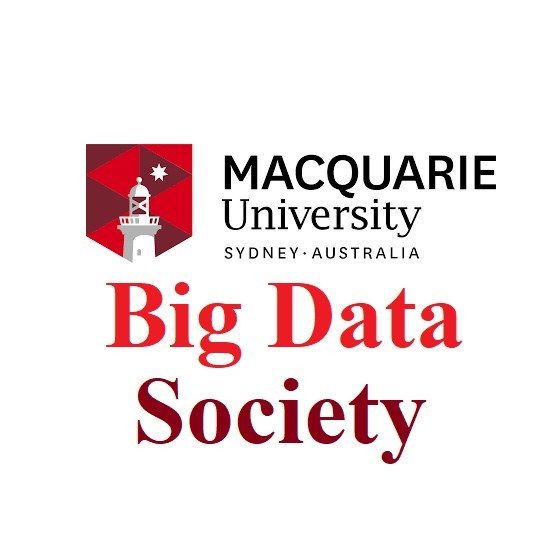



**“Even if your role does not directly involve the nuts and bolts of data science, it is useful to know what data visualization can do and how it is realized in the real world.”**

**– Ramie Jacobson**

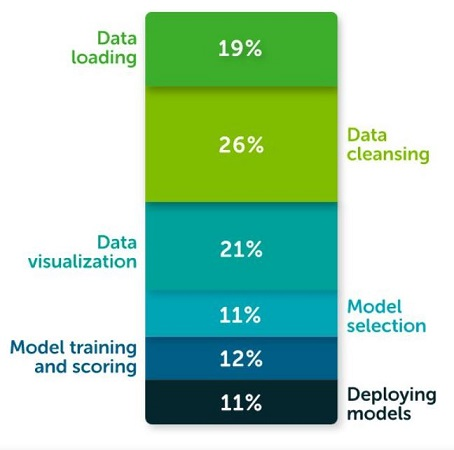

## Previous Session
* Introduction to Data Visualization
---
* Libraries used in tutorial for Visualization
> Matplotlib <br>
> Seaborn
---
* Different types of Visualizations
> Line Charts <br>
> Area Plots <br>
> Histograms <br>
> Bar Charts <br>
> Pie Charts <br>
> Box Plots <br>
> Scatter Plots <br>
> Heatmaps 
---



##This Session

* Libraries used in this tutorial for Visualization
> Folium <br>
> Altair <br>
> Plotly <br>
> Seaborn <br>
> Ggplot <br>
> Bokeh
---
* Different types of Visualizations
> Cluster Heatmap <br>
> 3D Plots <br>
> Violin Plot <br>
> Bar Chart with Rounded Edges <br>
> Strip Plot <br>
> Radial Chart <br>
> Selection Chart <br>
> Parallel Coordinate Chart <br>
> Ridgeline Plot <br>
> Bubble Chart <br>
> Horizontal lollipop plot
---


##Altair

This chart shows the most basic **line chart**, made from a dataframe with two columns:

In [ ]:
import altair as alt
import numpy as np
import pandas as pd

x = np.arange(100)
source = pd.DataFrame({
  'x': x,
  'f(x)': np.sin(x / 5)
})

alt.Chart(source).mark_line().encode(
    x='x',
    y='f(x)'
)

alt.Chart(...)

This example shows a basic bar chart created with Altair:

In [ ]:
import altair as alt
import pandas as pd

source = pd.DataFrame({
    'a': ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I'],
    'b': [28, 55, 43, 91, 81, 53, 19, 87, 52]
})

alt.Chart(source).mark_bar().encode(
    x='a',
    y='b'
)

alt.Chart(...)

In [ ]:
import altair as alt
import pandas as pd

source = pd.DataFrame({
    'a': ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I'],
    'b': [28, 55, 43, 91, 81, 53, 19, 87, 52]
})

alt.Chart(source).mark_bar().encode(
    x='b',
    y='a'
)

alt.Chart(...)

This example shows how to create a bar chart with rounded edges:

In [ ]:
import altair as alt
from vega_datasets import data

source = data.seattle_weather()
source

,date,precipitation,temp_max,temp_min,wind,weather
0,2012-01-01,0.0,12.8,5.0,4.7,drizzle
1,2012-01-02,10.9,10.6,2.8,4.5,rain
2,2012-01-03,0.8,11.7,7.2,2.3,rain
3,2012-01-04,20.3,12.2,5.6,4.7,rain
4,2012-01-05,1.3,8.9,2.8,6.1,rain
...,...,...,...,...,...,...
1456,2015-12-27,8.6,4.4,1.7,2.9,fog
1457,2015-12-28,1.5,5.0,1.7,1.3,fog
1458,2015-12-29,0.0,7.2,0.6,2.6,fog
1459,2015-12-30,0.0,5.6,-1.0,3.4,sun


In [ ]:
alt.Chart(source).mark_bar(
    cornerRadiusTopLeft=3,
    cornerRadiusTopRight=3
).encode(
    x='month(date):O',
    y='count():Q',
    color='weather:N'
)

alt.Chart(...)

In [ ]:
import altair as alt
from vega_datasets import data

source = data.barley()
source.head()

,yield,variety,year,site
0,27.00000,Manchuria,1931,University Farm
1,48.86667,Manchuria,1931,Waseca
2,27.43334,Manchuria,1931,Morris
3,39.93333,Manchuria,1931,Crookston
4,32.96667,Manchuria,1931,Grand Rapids


In [ ]:
alt.Chart(source).mark_bar().encode(
    x='sum(yield)',
    y='variety',
    color='site'
)

alt.Chart(...)

In [ ]:
alt.Chart(source).mark_bar().encode(
    x='year:O',
    y='sum(yield):Q',
    color='year:N',
    column='site:N'
)

alt.Chart(...)

A simple example of how to make a **strip plot**:

In [ ]:
import altair as alt
from vega_datasets import data

source = data.cars()
source.head()

,Name,Miles_per_Gallon,Cylinders,Displacement,Horsepower,Weight_in_lbs,Acceleration,Year,Origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,1970-01-01,USA
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,1970-01-01,USA
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,1970-01-01,USA
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,1970-01-01,USA
4,ford torino,17.0,8,302.0,140.0,3449,10.5,1970-01-01,USA


In [ ]:
alt.Chart(source).mark_tick().encode(
    x='Horsepower:Q',
    y='Cylinders:O'
)

alt.Chart(...)

**A bar chart overlayed with a rolling mean**

 In this example the average of values over the previous decade is displayed as a line:

In [ ]:
import altair as alt
from vega_datasets import data

source = data.wheat()
source.head()

,year,wheat,wages
0,1565,41.0,5.00
1,1570,45.0,5.05
2,1575,42.0,5.08
3,1580,49.0,5.12
4,1585,41.5,5.15


The **window transform performs calculations over sorted groups of data objects**. These calculations include ranking, lead/lag analysis, and aggregates such as cumulative sums and averages. Calculated values are written back to the input data stream, where they can be referenced by encodings.

In [ ]:
bar = alt.Chart(source).mark_bar().encode(
    x='year:O',
    y='wheat:Q'
)

line = alt.Chart(source).mark_line(color='red').transform_window(
    # The field to average
    rolling_mean='mean(wheat)',
    # The number of values before and after the current value to include.
    frame=[-9, 0]
).encode(
    x='year:O',
    y='rolling_mean:Q'
)

(bar + line).properties(width=600)

alt.LayerChart(...)

### Pie Chart with Labels:

In [ ]:
import pandas as pd
import altair as alt

source = pd.DataFrame(
    {
        "category": ["a", "b", "c", "d", "e", "f"], 
     "value": [4, 6, 10, 3, 7, 8]
     }
)
source.head()

,category,value
0,a,4
1,b,6
2,c,10
3,d,3
4,e,7


In [ ]:
base = alt.Chart(source).encode(
    theta=alt.Theta("value:Q", stack=True), color=alt.Color("category:N", legend=None)
)

pie = base.mark_arc(outerRadius=120)
text = base.mark_text(radius=140, size=20).encode(text="category:N")

pie + text

alt.LayerChart(...)

### Radial Chart:

This radial plot uses both angular and radial extent to convey multiple dimensions of data.

In [ ]:
import pandas as pd
import altair as alt

source = pd.DataFrame({"values": [12, 23, 47, 6, 52, 19]})
source.head()

,values
0,12
1,23
2,47
3,6
4,52


https://altair-viz.github.io/user_guide/generated/core/altair.Scale.html
https://altair-viz.github.io/user_guide/generated/channels/altair.Theta.html

In [ ]:
base = alt.Chart(source).encode(
    theta=alt.Theta("values:Q", stack=True),
    radius=alt.Radius("values", scale=alt.Scale(type="sqrt", zero=True, rangeMin=20)),
    color="values:N",
)

c1 = base.mark_arc(innerRadius=20, stroke="#fff")   # pie chart

c2 = base.mark_text(radiusOffset=10).encode(text="values:Q")

c1 + c2

alt.LayerChart(...)

In [ ]:
# load an example dataset
from vega_datasets import data
cars = data.cars()

import altair as alt

points = alt.Chart(cars).mark_point().encode(
  x='Year:T',
  y='Miles_per_Gallon',
  color='Origin').properties(width=800)

lines = alt.Chart(cars).mark_line().encode(
  x='Year:T',
  y='mean(Miles_per_Gallon)',
  color='Origin').properties(width=800).interactive(bind_y=False)
              
points + lines

alt.LayerChart(...)

## Folium

In [ ]:
import folium
world_map = folium.Map(width=500,height=500)
world_map

In [ ]:
from branca.element import Figure
fig = Figure(width=500, height=500)
m = folium.Map()
fig.add_child(m)

In [ ]:
world_map_sydney = folium.Map(location=[-33.865,151.209], zoom_start=4, width=800, height=800)
world_map_sydney

In [ ]:
world_map_sydney = folium.Map(location=[-33.865,151.209], zoom_start=4, tiles = 'Stamen Toner', width=800, height=800)
world_map_sydney

In [ ]:
world_map_sydney = folium.Map(location=[-33.865,151.209], zoom_start=4, tiles = 'Stamen Terrain', width=800, height=800)
world_map_sydney

In [ ]:
world_map_sydney = folium.Map(location=[-33.865,151.209], zoom_start=4, width=800, height=800)

sydney = folium.map.FeatureGroup()

# create children and add them to the group
sydney.add_child(folium.CircleMarker([-33.865,151.209], radius = 5, color='red', fill_color='Red'))

world_map_sydney.add_child(sydney)

In [ ]:
folium.Marker([-33.865,151.209], popup='Sydney').add_to(world_map_sydney)
world_map_sydney

## Plotly

Plotly is a javascript library for data visualization. It is based on the famous d3.js library, and provides a python wrapper allowing to build stunning interactive charts directly from Python. Most of the gallery sections provide plotly examples, this post provides a few general tips.

In [ ]:
import plotly.graph_objects as go
import plotly.express as px
import numpy as np

np.random.seed(10)
x = np.arange(12)
y = np.random.randint(5, 500, size=12)

In [ ]:
fig = go.Figure(data=go.Scatter(x=x,y=y))
fig.update_layout(title = 'Simple Line Plot', xaxis_title= 'Month', yaxis_title='Sales')
fig.show()

In [ ]:
# just a single command
fig = px.line(x=x, y=y, title='Sample Line Plot', labels=dict(x='Month', y='Sales'))
fig.show()

**Parallel coordinate chart with Plotly:**

In [1]:
# Import the library
import plotly.express as px

# Load the iris dataset provided by the library
df = px.data.iris()
df.head()

,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1


https://plotly.com/python-api-reference/generated/plotly.express.parallel_coordinates.html

In [6]:
# Create the chart:
fig = px.parallel_coordinates(
    df, 
    color="species_id", 
    labels={"species_id": "Species","sepal_width": "Sepal Width", "sepal_length": "Sepal Length", "petal_width": "Petal Width", "petal_length": "Petal Length", })

# Hide the color scale that is useless in this case
fig.update_layout(coloraxis_showscale=False)

# Show the plot
fig.show()

## Seaborn

**Visualizing Missing Data using Seaborn heatmap():**

First, we will use Seaborn’s heatmap() to make a heatmap of the data to visualize the missing data in each variable. Here we use the transposed boolean dataframe from isna() as input Seaborn’s heatmap() function.


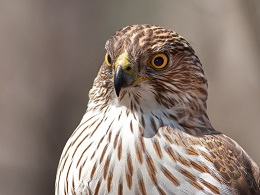

In [7]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

url = "https://vincentarelbundock.github.io/Rdatasets/csv/Stat2Data/Hawks.csv"
hawks = pd.read_csv(url, index_col=0)
hawks.head()

,Month,Day,Year,CaptureTime,ReleaseTime,BandNumber,Species,Age,Sex,Wing,Weight,Culmen,Hallux,Tail,StandardTail,Tarsus,WingPitFat,KeelFat,Crop
1,9,19,1992,13:30,NaN,877-76317,RT,I,NaN,385.0,920.0,25.7,30.1,219,NaN,NaN,NaN,NaN,NaN
2,9,22,1992,10:30,,877-76318,RT,I,NaN,376.0,930.0,NaN,NaN,221,NaN,NaN,NaN,NaN,NaN
3,9,23,1992,12:45,,877-76319,RT,I,NaN,381.0,990.0,26.7,31.3,235,NaN,NaN,NaN,NaN,NaN
4,9,23,1992,10:50,,745-49508,CH,I,F,265.0,470.0,18.7,23.5,220,NaN,NaN,NaN,NaN,NaN
5,9,27,1992,11:15,,1253-98801,SS,I,F,205.0,170.0,12.5,14.3,157,NaN,NaN,NaN,NaN,NaN


In [8]:
hawks.isna().transpose().head(19)

,1,2,3,4,5,6,7,8,9,10,...,899,900,901,902,903,904,905,906,907,908
Month,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Day,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Year,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
CaptureTime,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
ReleaseTime,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
BandNumber,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Species,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Age,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
Sex,True,True,True,False,False,True,True,True,True,True,...,False,True,True,True,True,True,False,True,True,True
Wing,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


https://seaborn.pydata.org/generated/seaborn.heatmap.html

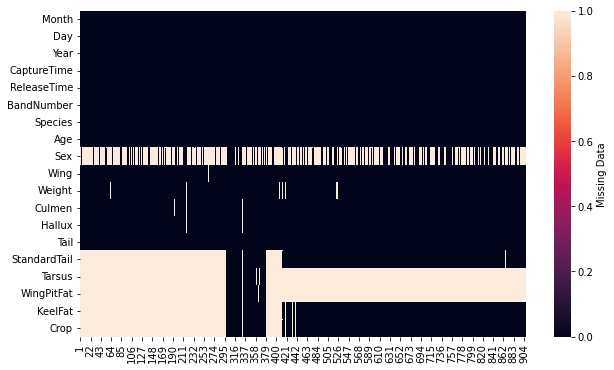

In [9]:
plt.figure(figsize=(10,6))
sns.heatmap(hawks.isna().transpose(),
            cbar_kws={'label': 'Missing Data'})
plt.savefig("visualizing_missing_data_with_heatmap_Seaborn_Python.png", dpi=100)

**Visualizing Missing Data using Seaborn displot():**

Another way to visualise missing data is to compute the proportion of the missing data for each variable in the data and make **stacked barplot**. We can use Seaborn’s displot() function. Here we provide the data in long form using melt() to displot() function.


Pandas melt() function is used to change the DataFrame format from wide to long. It's used to create a specific format of the DataFrame object where one or more columns work as identifiers. All the remaining columns are treated as values and unpivoted to the row axis and only two columns – variable and value.

https://seaborn.pydata.org/generated/seaborn.displot.html


<Figure size 720x432 with 0 Axes>

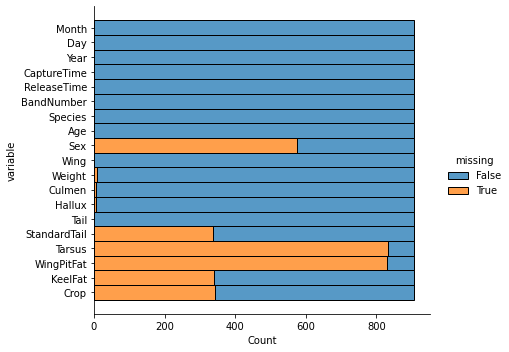

In [17]:
plt.figure(figsize=(10,6))
sns.displot(
    data=hawks.isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="stack",
    aspect=1.25
)
plt.savefig("visualizing_missing_data_with_barplot_Seaborn_distplot.png", dpi=100)

<Figure size 720x432 with 0 Axes>

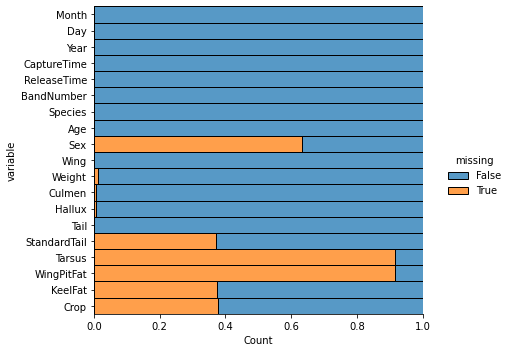

In [18]:
plt.figure(figsize=(10,6))
sns.displot(
    data=hawks.isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=1.25
)
plt.savefig("visualizing_missing_data_with_barplot_Seaborn_distplot.png", dpi=100)


**Ridgeline Plots**
Ridgeline plots are great to visualize numerical distributions corresponding to multiple groups or categorical variables. Ridgeline plots make density plots or histograms for each group one on top of each other and thus making it look like “a mountain range”. They are great for visualizing changes in numerical distributions over time or space.

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd 
pd.options.mode.chained_assignment = None  # default='warn'

In [ ]:
food_consumption = pd.read_csv('https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-02-18/food_consumption.csv')
food_consumption.head()

,country,food_category,consumption,co2_emmission
0,Argentina,Pork,10.51,37.20
1,Argentina,Poultry,38.66,41.53
2,Argentina,Beef,55.48,1712.00
3,Argentina,Lamb & Goat,1.56,54.63
4,Argentina,Fish,4.36,6.96


We filter the data set first to contain CO2 emission values greater than 10. We use Pandas’ query() function to select rows based on another column values. And then perform log transformation using Pandas’ apply() function.

In [ ]:
# filter Pandas rows' with query() function
food_consumption = food_consumption.query("co2_emmission>10")
# perform log transformation using apply() in Pandas
food_consumption["co2_emission"] = food_consumption["co2_emmission"].apply("log10")

In [ ]:
food_consumption.head()

,country,food_category,consumption,co2_emmission,co2_emission
0,Argentina,Pork,10.51,37.20,1.570543
1,Argentina,Poultry,38.66,41.53,1.618362
2,Argentina,Beef,55.48,1712.00,3.233504
3,Argentina,Lamb & Goat,1.56,54.63,1.737431
5,Argentina,Eggs,11.39,10.46,1.019532


With FacetGrid we can specify which variable should be on rows and how we want to color the plot and the figure sizes. This creates a empty grid for us. Then we can use map() function make density plot in each element of the grid. In Ridgeline plot, we need density plot, we call Seaborn’s kdeplot() with the variable of interest. We use the shade=True to fill the density plot with color.

Then we also use map() to create a horizontal line using plt.axhline with the goal to highlight the x-axis line for each facet.

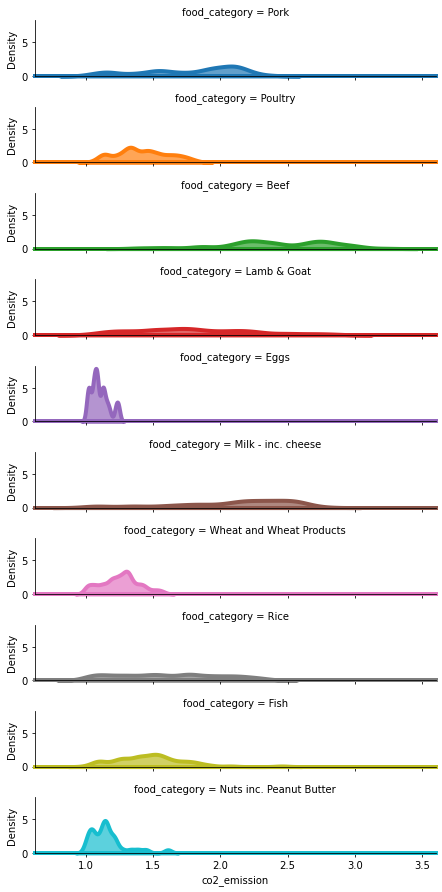

In [ ]:
# Use FacetGrid to create the facet with one column
ridge_plot = sns.FacetGrid(food_consumption, row="food_category", hue="food_category", aspect=5, height=1.25)

# Use map function to make density plot in each element of the grid.
ridge_plot.map(sns.kdeplot, "co2_emission", clip_on=False, shade=True, alpha=0.7, lw=4, bw_method=.2)
ridge_plot.map(plt.axhline, y=0, lw=4, clip_on=False)
ridge_plot.savefig("Ridgeline_plot_Seaborn_first_step.png")

**Cluster HeatMap**

In [ ]:
#Example Python program that creates a clustered heatmap using the Python #visualization library Seaborn
import matplotlib.pyplot as plt
import seaborn as sbn
import pandas as pds

In [ ]:
# GDP data for six states for 12 months
s1 = [100, 94, 56, 76, 81, 91, 51, 55, 72, 66, 60, 58 ];
s2 = [82, 81, 94, 96, 93, 84, 80, 82, 84, 86, 81, 78];
s3 = [65, 61, 66, 62, 67, 71, 69, 73, 68, 64, 66, 70];
s4 = [150, 140, 145, 151, 156, 152, 160, 165, 159, 149, 155, 162];
s5 = [75, 74, 76, 78, 80, 82, 85, 81, 77, 73, 75, 67];
s6 = [80, 75, 70, 72, 67, 65, 62, 63, 65, 60, 66, 69];

In [ ]:
# Months
months= ["Jan", "Feb", "Mar", "Apr",
         "May", "Jun", "Jul", "Aug",
         "Sep", "Oct", "Nov", "Dec"];

In [ ]:
# Python dictionary of states vs their GDPs
d1 = {"State1":s1,
      "State2":s2,
      "State3":s3,
      "State4":s4,
      "State5":s5,
      "State6":s6};

# Create a pandas dataframe
df = pds.DataFrame(data=d1, index=months);
print(df);
print('-'*60)
print(df.columns);
print('-'*60)
print(df.index);

     State1  State2  State3  State4  State5  State6
Jan     100      82      65     150      75      80
Feb      94      81      61     140      74      75
Mar      56      94      66     145      76      70
Apr      76      96      62     151      78      72
May      81      93      67     156      80      67
Jun      91      84      71     152      82      65
Jul      51      80      69     160      85      62
Aug      55      82      73     165      81      63
Sep      72      84      68     159      77      65
Oct      66      86      64     149      73      60
Nov      60      81      66     155      75      66
Dec      58      78      70     162      67      69
------------------------------------------------------------
Index(['State1', 'State2', 'State3', 'State4', 'State5', 'State6'], dtype='object')
------------------------------------------------------------
Index(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct',
       'Nov', 'Dec'],
      dtype='object

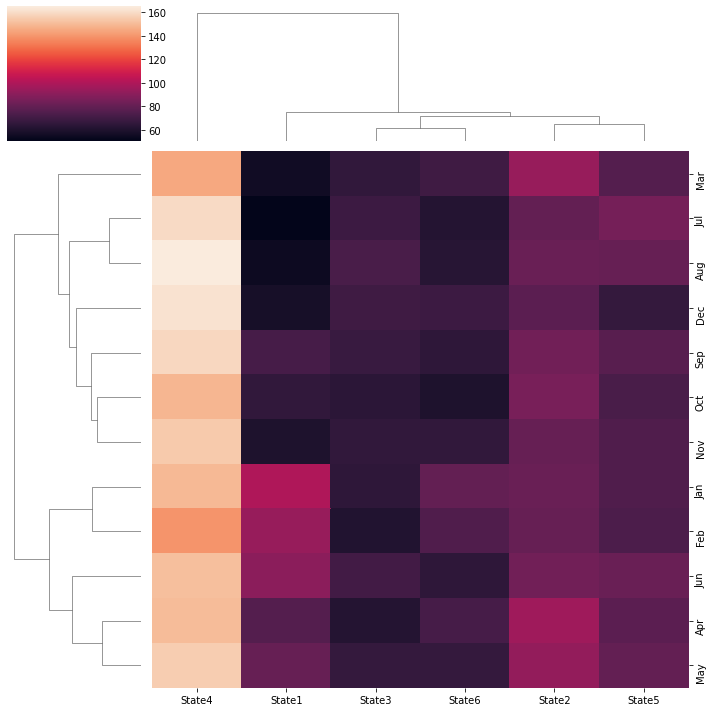

In [ ]:
# Create a clustermap using seaborn
sbn.clustermap(df);
plt.show();

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
from sklearn.datasets import load_breast_cancer
bc_data = load_breast_cancer()
data = pd.DataFrame(bc_data.data, columns=bc_data.feature_names)
data.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
data['target']=bc_data.target
data['target']

0      0
1      0
2      0
3      0
4      0
      ..
564    0
565    0
566    0
567    0
568    1
Name: target, Length: 569, dtype: int64

In [ ]:
data.iloc[0:3,0:3]

,mean radius,mean texture,mean perimeter
0,17.99,10.38,122.8
1,20.57,17.77,132.9
2,19.69,21.25,130.0


In [ ]:
color_dict=dict(zip(np.unique(bc_data.target),np.array(['g','skyblue'])))
target_df = pd.DataFrame({"target":bc_data.target})
target_df.head()

,target
0,0
1,0
2,0
3,0
4,0


In [ ]:
row_colors = target_df.target.map(color_dict)

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.


In [ ]:
pip install fastcluster

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 194 kB 4.1 MB/s 


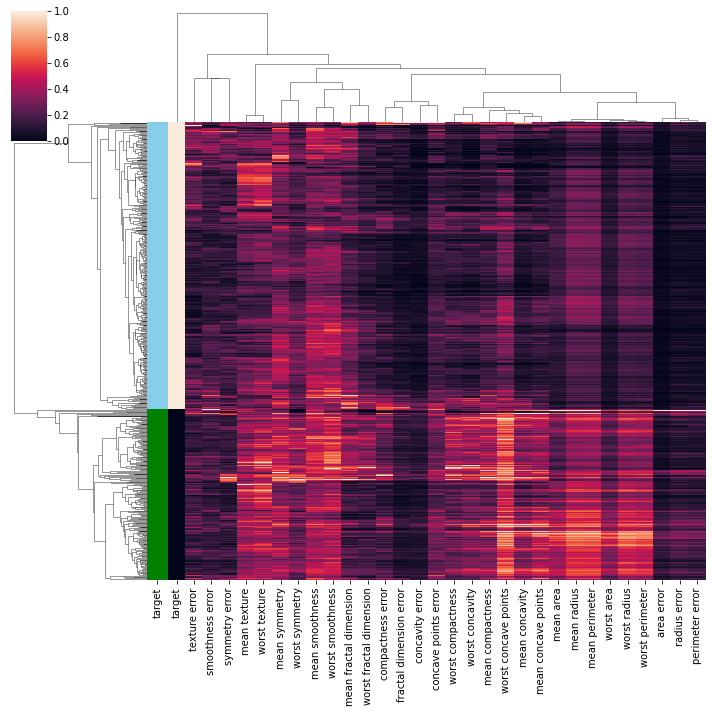

In [ ]:
sns.clustermap(data, 
               metric="correlation",
               standard_scale=1,
               row_colors=row_colors,
               yticklabels=False)
plt.savefig('hierarchical_clustered_heatmap_2_with_Seaborn_clustermap_python.png', dpi=150)

In [ ]:
!pip install chart_studio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 64 kB 1.8 MB/s 
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11447 sha256=c002d4d7d78aab80b6a8968d9c1befe686469e96d350f26a7e04833366fb798a
  Stored in directory: /root/.cache/pip/wheels/f9/8d/8d/f6af3f7f9eea3553bc2fe6d53e4b287dad18b06a861ac56ddf
Successfully built retrying


In [ ]:
# plotly standard imports
import plotly.graph_objs as go
import chart_studio.plotly as py
from plotly.offline import iplot, init_notebook_mode


# Cufflinks wrapper on plotly
import cufflinks

# Data science imports
import pandas as pd
import numpy as np

# Options for pandas
pd.options.display.max_columns = 30

# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"

In [ ]:
from plotly.offline import iplot
init_notebook_mode()
cufflinks.go_offline(connected=True)

# Set global theme
cufflinks.set_config_file(world_readable=True, theme="pearl")

In [ ]:
df = pd.read_parquet(
    "https://github.com/WillKoehrsen/Data-Analysis/blob/master/plotly/data/medium_data_2019_01_06?raw=true"
)
df.head()

,claps,days_since_publication,fans,link,num_responses,publication,published_date,read_ratio,read_time,reads,started_date,tags,text,title,title_word_count,type,views,word_count,claps_per_word,editing_days,<tag>Education,<tag>Data Science,<tag>Towards Data Science,<tag>Machine Learning,<tag>Python
119,2,574.858594,2,https://medium.com/p/screw-the-environment-but...,0,None,2017-06-10 14:25:00,41.98,7,68,2017-06-10 14:24:00,"[Climate Change, Economics]","Screw the Environment, but Consider Your Walle...","Screw the Environment, but Consider Your Wallet",8,published,162,1859,0.001076,0,0,0,0,0,0
118,18,567.540639,3,https://medium.com/p/the-vanquishing-of-war-pl...,0,None,2017-06-17 22:02:00,32.93,14,54,2017-06-17 22:02:00,"[Climate Change, Humanity, Optimism, History]","The Vanquishing of War, Plague and Famine Part...","The Vanquishing of War, Plague and Famine",8,published,164,3891,0.004626,0,0,0,0,0,0
121,50,554.920762,19,https://medium.com/p/capstone-project-mercedes...,0,None,2017-06-30 12:55:00,20.19,42,215,2017-06-30 12:00:00,"[Machine Learning, Python, Udacity, Kaggle]",Capstone Project: Mercedes-Benz Greener Manufa...,Capstone Project: Mercedes-Benz Greener Manufa...,7,published,1065,12025,0.004158,0,0,0,0,1,1
122,0,554.078160,0,https://medium.com/p/home-of-the-scared-5af0fe...,0,None,2017-07-01 09:08:00,35.85,9,19,2017-06-30 18:21:00,"[Politics, Books, News, Media Criticism]",Home of the Scared A review of A Culture of Fe...,Home of the Scared,4,published,53,2533,0.000000,0,0,0,0,0,0
114,0,550.090507,0,https://medium.com/p/the-triumph-of-peace-f485...,0,None,2017-07-05 08:51:00,8.77,14,5,2017-07-03 20:18:00,"[Books, Psychology, History, Humanism]",The Triumph of Peace A review of The Better An...,The Triumph of Peace,4,published,57,3892,0.000000,1,0,0,0,0,0


In [ ]:
creds = py.get_credentials()
print(creds)
username = creds['username']
api_key = creds['api_key']

{'username': '', 'api_key': '', 'proxy_username': '', 'proxy_password': '', 'stream_ids': []}


In [ ]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

In [ ]:
from plotly.offline import iplot
import plotly.graph_objs as go

enable_plotly_in_cell()

data = [
    go.Contour(
        z=[[10, 10.625, 12.5, 15.625, 20],
           [5.625, 6.25, 8.125, 11.25, 15.625],
           [2.5, 3.125, 5., 8.125, 12.5],
           [0.625, 1.25, 3.125, 6.25, 10.625],
           [0, 0.625, 2.5, 5.625, 10]]
    )
]
iplot(data)

## 3D Plots

https://jakevdp.github.io/PythonDataScienceHandbook/04.12-three-dimensional-plotting.html

In [ ]:
from mpl_toolkits import mplot3d

In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

Once this submodule is imported, a three-dimensional axes can be created by passing the keyword projection='3d' to any of the normal axes creation routines:

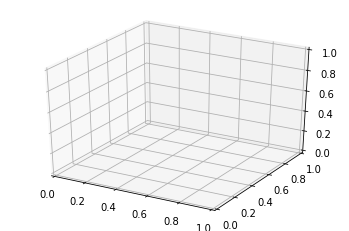

In [ ]:
fig = plt.figure()
ax = plt.axes(projection='3d')

Three-dimensional Points and Lines
The most basic three-dimensional plot is a line or collection of scatter plot created from sets of (x, y, z) triples. In analogy with the more common two-dimensional plots discussed earlier, these can be created using the ax.plot3D and ax.scatter3D functions. The call signature for these is nearly identical to that of their two-dimensional counterparts, so you can refer to Simple Line Plots and Simple Scatter Plots for more information on controlling the output. Here we'll plot a trigonometric spiral, along with some points drawn randomly near the line:

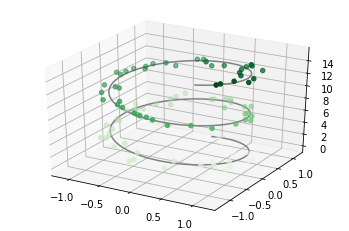

In [ ]:
ax = plt.axes(projection='3d')

# Data for a three-dimensional line
zline = np.linspace(0, 15, 1000)
xline = np.sin(zline)
yline = np.cos(zline)
ax.plot3D(xline, yline, zline, 'gray')

# Data for three-dimensional scattered points
zdata = 15 * np.random.random(100)
xdata = np.sin(zdata) + 0.1 * np.random.randn(100)
ydata = np.cos(zdata) + 0.1 * np.random.randn(100)
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');

Three-dimensional Contour Plots¶
Analogous to the contour plots we explored in Density and Contour Plots, mplot3d contains tools to create three-dimensional relief plots using the same inputs. Like two-dimensional ax.contour plots, ax.contour3D requires all the input data to be in the form of two-dimensional regular grids, with the Z data evaluated at each point. Here we'll show a three-dimensional contour diagram of a three-dimensional sinusoidal function:

In [ ]:
def f(x, y):
    return np.sin(np.sqrt(x ** 2 + y ** 2))

x = np.linspace(-6, 6, 30)
y = np.linspace(-6, 6, 30)

X, Y = np.meshgrid(x, y)
Z = f(X, Y)

/usr/local/lib/python3.7/dist-packages/mpl_toolkits/mplot3d/art3d.py:304: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  self._segments3d = np.asanyarray(segments)


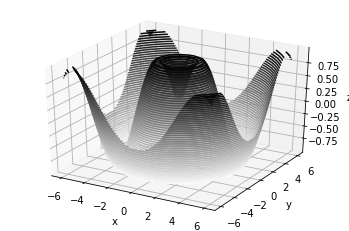

In [ ]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(X, Y, Z, 50, cmap='binary')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z');

Sometimes the default viewing angle is not optimal, in which case we can use the view_init method to set the elevation and azimuthal angles. In the following example, we'll use an elevation of 60 degrees (that is, 60 degrees above the x-y plane) and an azimuth of 35 degrees (that is, rotated 35 degrees counter-clockwise about the z-axis):

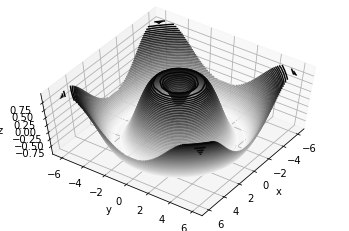

In [ ]:
ax.view_init(60, 35)
fig

**Wireframes and Surface Plots**

Two other types of three-dimensional plots that work on gridded data are wireframes and surface plots. These take a grid of values and project it onto the specified three-dimensional surface, and can make the resulting three-dimensional forms quite easy to visualize. Here's an example of using a wireframe:

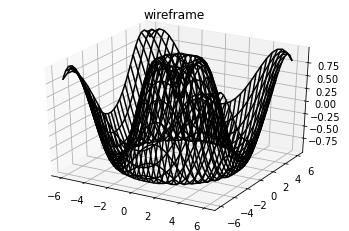

In [ ]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.plot_wireframe(X, Y, Z, color='black')
ax.set_title('wireframe');

A surface plot is like a wireframe plot, but each face of the wireframe is a filled polygon. Adding a colormap to the filled polygons can aid perception of the topology of the surface being visualized:

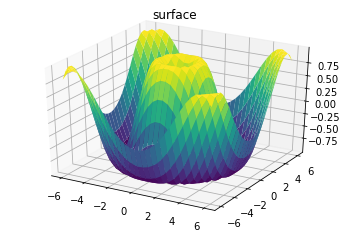

In [ ]:
ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1,
                cmap='viridis', edgecolor='none')
ax.set_title('surface');

Note that though the grid of values for a surface plot needs to be two-dimensional, it need not be rectilinear. Here is an example of creating a partial polar grid, which when used with the surface3D plot can give us a slice into the function we're visualizing:

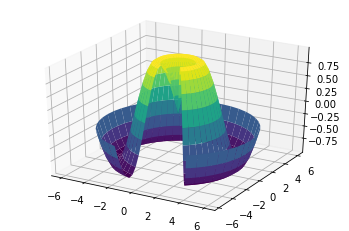

In [ ]:
r = np.linspace(0, 6, 20)
theta = np.linspace(-0.9 * np.pi, 0.8 * np.pi, 40)
r, theta = np.meshgrid(r, theta)

X = r * np.sin(theta)
Y = r * np.cos(theta)
Z = f(X, Y)

ax = plt.axes(projection='3d')
ax.plot_surface(X, Y, Z, rstride=1, cstride=1,
                cmap='viridis', edgecolor='none');

**Surface Triangulations**

For some applications, the evenly sampled grids required by the above routines is overly restrictive and inconvenient. In these situations, the triangulation-based plots can be very useful. What if rather than an even draw from a Cartesian or a polar grid, we instead have a set of random draws?

In [ ]:
theta = 2 * np.pi * np.random.random(1000)
r = 6 * np.random.random(1000)
x = np.ravel(r * np.sin(theta))
y = np.ravel(r * np.cos(theta))
z = f(x, y)

We could create a scatter plot of the points to get an idea of the surface we're sampling from:

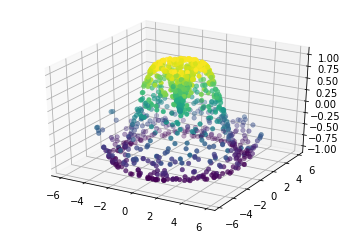

In [ ]:
ax = plt.axes(projection='3d')
ax.scatter(x, y, z, c=z, cmap='viridis', linewidth=0.5);

This leaves a lot to be desired. The function that will help us in this case is ax.plot_trisurf, which creates a surface by first finding a set of triangles formed between adjacent points (remember that x, y, and z here are one-dimensional arrays):


The result is certainly not as clean as when it is plotted with a grid, but the flexibility of such a triangulation allows for some really interesting three-dimensional plots. For example, it is actually possible to plot a three-dimensional Möbius strip using this, as we'll see next.

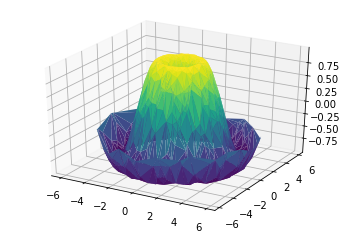

In [ ]:
ax = plt.axes(projection='3d')
ax.plot_trisurf(x, y, z,
                cmap='viridis', edgecolor='none');

**3D Scatter Plots**

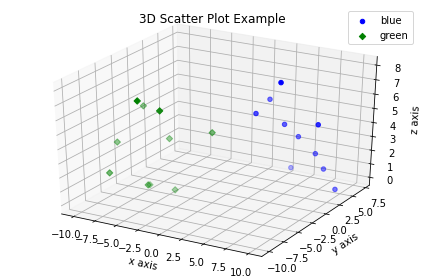

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import axes3d

fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')

x1 = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
y1 = np.random.randint(10, size=10)
z1 = np.random.randint(10, size=10)

x2 = [-1, -2, -3, -4, -5, -6, -7, -8, -9, -10]
y2 = np.random.randint(-10, 0, size=10)
z2 = np.random.randint(10, size=10)

ax.scatter(x1, y1, z1, c='b', marker='o', label='blue')
ax.scatter(x2, y2, z2, c='g', marker='D', label='green')

ax.set_xlabel('x axis')
ax.set_ylabel('y axis')
ax.set_zlabel('z axis')
plt.title("3D Scatter Plot Example")
plt.legend()
plt.tight_layout()
plt.show()

**3D Bar Plots**

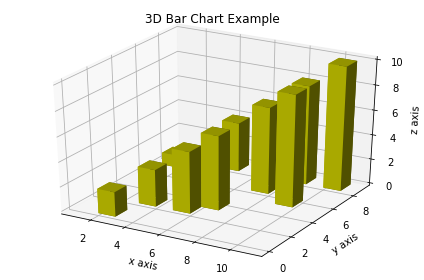

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')

x = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
y = np.random.randint(10, size=10)
z = np.zeros(10)

dx = np.ones(10)
dy = np.ones(10)
dz = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

ax.bar3d(x, y, z, dx, dy, dz, color='y')

ax.set_xlabel('x axis')
ax.set_ylabel('y axis')
ax.set_zlabel('z axis')
plt.title("3D Bar Chart Example")
plt.tight_layout()
plt.show()

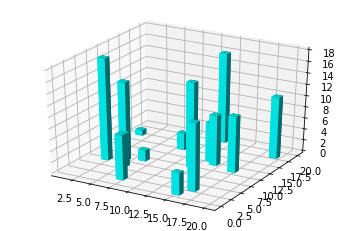

In [ ]:
import random
import numpy as np

fig = plt.figure()
ax = plt.axes(projection="3d")

num_bars = 15
x_pos = random.sample(range(20), num_bars)
y_pos = random.sample(range(20), num_bars)
z_pos = [0] * num_bars
x_size = np.ones(num_bars)
y_size = np.ones(num_bars)
z_size = random.sample(range(20), num_bars)

ax.bar3d(x_pos, y_pos, z_pos, x_size, y_size, z_size, color='aqua')
plt.show()

**Wireframe Plots**

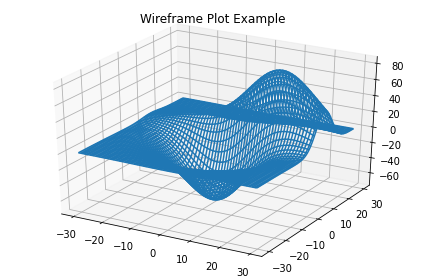

In [ ]:
import matplotlib.pyplot as plt

fig = plt.figure()
ax = fig.add_subplot(111, projection = '3d')

x, y, z = axes3d.get_test_data()

ax.plot_wireframe(x, y, z, rstride = 2, cstride = 2)

plt.title("Wireframe Plot Example")
plt.tight_layout()
plt.show()

We could plot 3D surfaces in Python too, the function to plot the 3D surfaces is *plot_surface(X,Y,Z)*, where X and Y are the output arrays from meshgrid, and **Z=f(X,Y)** or **Z(i,j)=f(X(i,j),Y(i,j))**. The most common surface plotting functions are surf and contour.

Make a plot of the surface **f(x,y)=sin(x)⋅cos(y) for −5≤x≤5, −5≤y≤5** using the plot_surface function. Take care to use a sufficiently fine discretization in x and y to make the plot look smooth.

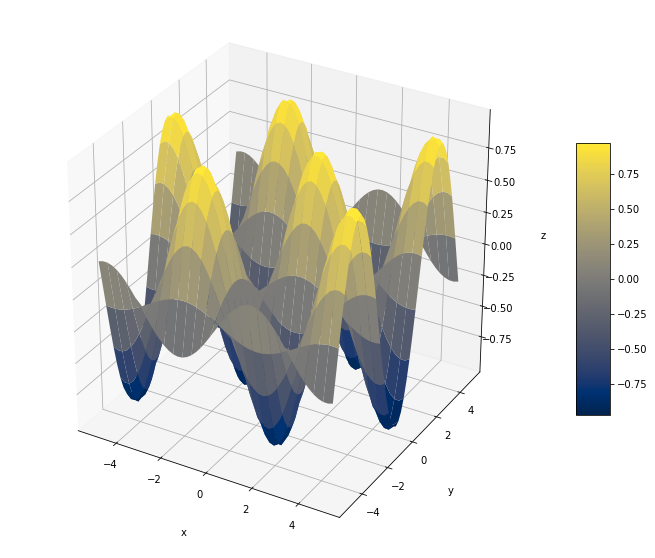

In [ ]:
fig = plt.figure(figsize = (12,10))
ax = plt.axes(projection='3d')

x = np.arange(-5, 5.1, 0.2)
y = np.arange(-5, 5.1, 0.2)

X, Y = np.meshgrid(x, y)
Z = np.sin(X)*np.cos(Y)

surf = ax.plot_surface(X, Y, Z, cmap = plt.cm.cividis)

# Set axes label
ax.set_xlabel('x', labelpad=20)
ax.set_ylabel('y', labelpad=20)
ax.set_zlabel('z', labelpad=20)

fig.colorbar(surf, shrink=0.5, aspect=8)

plt.show()

We could have subplots of different 3D plots as well. We could use the add_subplot function from the figure object we created to generate the subplots for 3D cases.



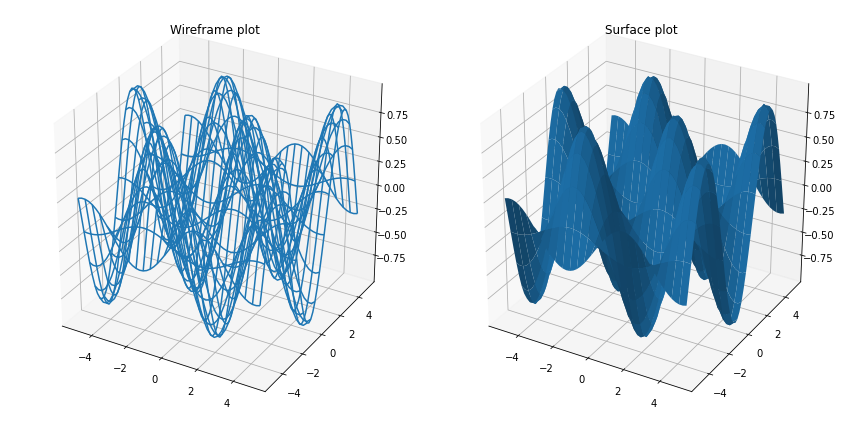

In [ ]:
fig = plt.figure(figsize=(12,6))


ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.plot_wireframe(X,Y,Z)
ax.set_title('Wireframe plot')

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.plot_surface(X,Y,Z)
ax.set_title('Surface plot')

plt.tight_layout()

plt.show()

## Bokeh



In [ ]:
pip install bokeh

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import bokeh
bokeh.__version__

'2.3.3'

Basic Plotting using Bokeh

In [ ]:
from bokeh.plotting import figure
from bokeh.io import output_file, sho+w, output_notebook, push_notebook
from bokeh.models import ColumnDataSource, HoverTool, CategoricalColorMapper
from bokeh.layouts import row, column, gridplot
from bokeh.models.widgets import Tabs, Panel
output_notebook()

In [ ]:
f = figure()
f.line([10,20,30,40,50], [60,70,80,40,50], line_width=12)

show(f)

**Plotting using Glyph**

In [ ]:
# circle glyph

p = figure(x_axis_label='x axis', y_axis_label='y axis', tools = 'pan, box_zoom')
p.circle(x=[50,40,30], y=[10,20,30], size=25, color='blue', alpha=0.7, line_color='yellow')

show(p)

In [ ]:
# Square Glyph

t = figure(plot_width=300, plot_height=500)
t.square([10,11,12,13,14,15], [16,17,12,14,15], size=20, color='blue', alpha=0.7)

show(t)

In [ ]:
# Multiple Lines

y = figure(plot_width=400, plot_height=500)
y.multi_line([[11,13,12],[31,41,16]],[[11,12,41],[14,71,18]], color=['red', 'blue'], alpha=[0.8,0.1],line_width=5)

show(y)

In [ ]:
# Wedge Glyph

z = figure(width=400, height=500)

z.wedge(x=[1,2,3], y=[1,2,3], radius=0.2, start_angle=0.4, end_angle=5.2, color='black', alpha=0.7, direction='clock')
show(z)

In [ ]:
# annular wedge glyph

q = figure(width=500, height=600)
q.annular_wedge(x=[10,20,30], y=[10,20,30], inner_radius=0.5, outer_radius=0.75, start_angle=0.5, end_angle=5.2, color='green', alpha=0.7)

show(q)

In [ ]:
# Combine circle and line on the same plot

x = [10,20,30,40]
y = [60,75,80,90]

u = figure(width=400, height=500)
u.line(x, y, line_width=2)
u.circle(x, y, fill_color='black', size=9)

show(u)

In [ ]:
# Bar Plot

x = [1,2,3,4,5]
y = [1,2,3,4,5]

g1 = figure(title='Bar Plot')
g1.hbar(x, right=y, height=0.6)

show(g1)

In [ ]:
# Vertical Bar Plot

x = [10,20,30]
y = [40,50,60]

g2 = figure(title='Vertical Bar Plot')
g2.vbar(x, top=y, width=0.6)

show(g2)

In [ ]:
# Scatter Plot

import random

x = [i for i in range(126)]
y = [random.random() + 2 for i in range(126)]
g3 = figure(title = 'Scatter Plot')
g3.scatter(x,y)

show(g3)

In [ ]:
# Area Plot

import numpy as np

x = [10,20,30,40,50]
y1 = [2,4,7,8,9]
y2 = [1,2,3,4,5]

h = figure(width=400, height=400)
h.varea(x=x, y1=y1, y2=y2, fill_color='green')
show(h)

In [ ]:
# Patch Plot

w = figure(width=400, height=400)
w.patch(x=[1,4,6,9], y=[2,3,7,8], color='navy')

show(w)

In [ ]:
from bokeh.plotting import gmap
from bokeh.models import GMapOptions

In [ ]:
latitude1 = 40.730610
longitude1 = -73.935242
map_type='hybrid'
zoom=14

google_map_options = GMapOptions(lat=latitude1, lng=longitude1, map_type=map_type, zoom=zoom)

title = 'Newyork Map'
google_api_key = ''
google_map = gmap(google_api_key, google_map_options, title=title)

source1 = ColumnDataSource(data=dict(lat=[40.730610,40.741, 40.75], lon=[-73.935242, -73.95, -73.97]))
x = 'lon'
y = 'lat'
size = 30
fill_color = 'red'
fill_alpha = 1

google_map.square(x=x, y=y, size=size, fill_color=fill_color, fill_alpha=fill_alpha, source=source1)

show(google_map)

## Ggplot

In [ ]:
pip install ggplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.2 MB 4.2 MB/s 


In [ ]:
# import libraries

import seaborn as sns
import pandas as pd
from pandas.plotting import scatter_matrix
from matplotlib import pyplot as pyplot
from matplotlib import font_manager as fmgr
from pandas.plotting import autocorrelation_plot

import plotnine
from plotnine import ggplot, geom_line, aes

import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import numpy as np

from datetime import datetime, timedelta

###Line Plot

In [ ]:
work_years = [1,2,3,4,5]
income = [6500,12900,10000,13200,47000]

df = pd.DataFrame({'Years at work': work_years, 'Income': income})
df.head()

,Years at work,Income
0,1,6500
1,2,12900
2,3,10000
3,4,13200
4,5,47000


In [ ]:
l_p = ggplot(data=df, mapping=aes(x='Years at work', y='Income'))

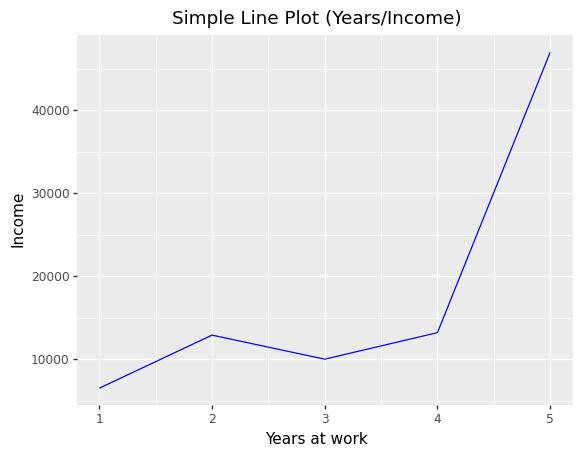

In [ ]:
(l_p + plotnine.geom_line(color='blue') + plotnine.labs(title='Simple Line Plot (Years/Income)')).draw();

In [ ]:
# Multiline Plot

work_years = [1,2,3,4]
ml_engineers_income = [10000, 12000,14000,16000]
sde_income = [8000,11000,10000,17000]

income_df = pd.DataFrame({'Years at work': work_years, 'MLE Income': ml_engineers_income, 'SDE Income': sde_income})
income_df.head()

,Years at work,MLE Income,SDE Income
0,1,10000,8000
1,2,12000,11000
2,3,14000,10000
3,4,16000,17000


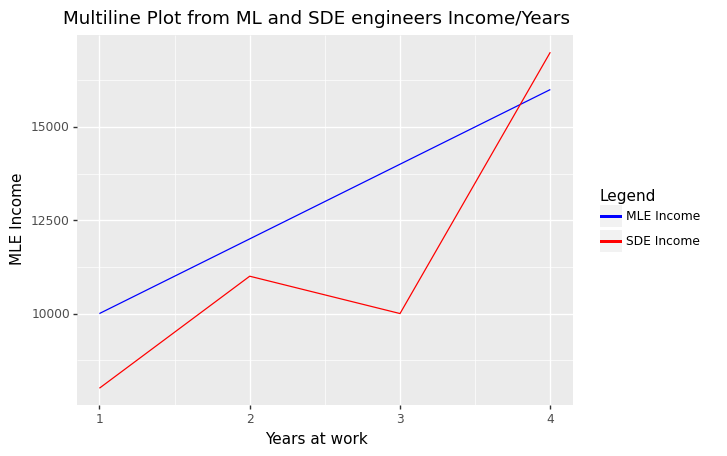

In [ ]:
(ggplot() +
 plotnine.geom_line(data=income_df, mapping=aes(x='Years at work', y='MLE Income', color="'blue'")) +
 plotnine.geom_line(data=income_df, mapping=aes(x='Years at work', y='SDE Income', color="'red'")) +
 plotnine.labs(title='Multiline Plot from ML and SDE engineers Income/Years') +
 plotnine.scale_color_identity(guide='legend', name='Legend', breaks=['blue','red'], labels=['MLE Income', 'SDE Income'])).draw();

In [ ]:
# Bar Plot

df = sns.load_dataset('titanic')
df.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


/usr/local/lib/python3.7/dist-packages/plotnine/utils.py:1246: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if pdtypes.is_categorical(arr):


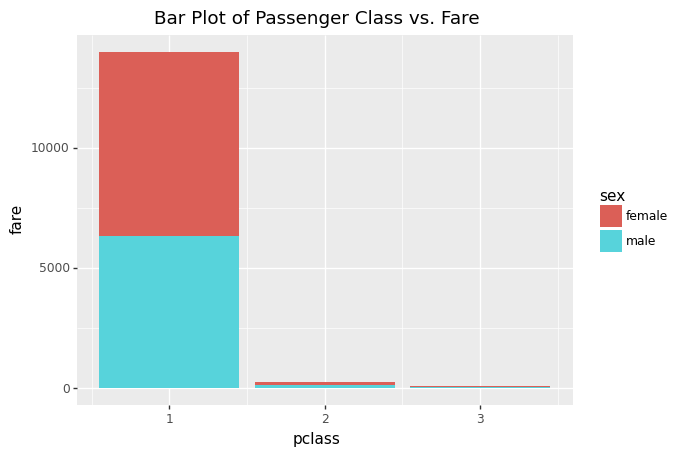

In [ ]:
(plotnine.ggplot(data=df.dropna(), mapping=aes(x='pclass', y='fare', fill='sex'))+
 plotnine.geom_col()+
 plotnine.labs(title='Bar Plot of Passenger Class vs. Fare')).draw();

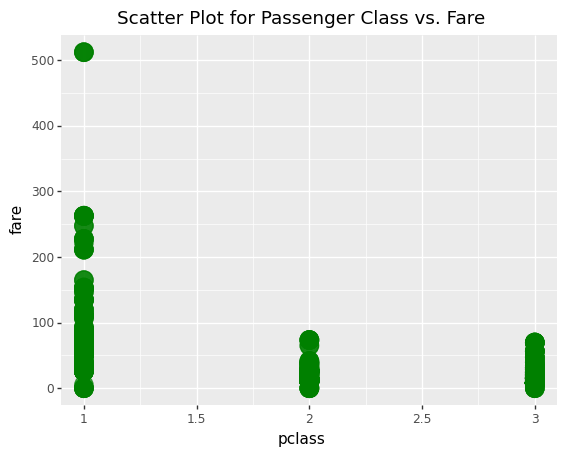

In [ ]:
# Scatter Plot

scatter_plot = ggplot(data=df, mapping=aes(x='pclass', y='fare'))

(scatter_plot + 
 plotnine.labs(title='Scatter Plot for Passenger Class vs. Fare')+
 plotnine.geom_point(shape='o', size=7, color='green', alpha=0.7)).draw();

/usr/local/lib/python3.7/dist-packages/plotnine/utils.py:1246: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if pdtypes.is_categorical(arr):
/usr/local/lib/python3.7/dist-packages/plotnine/stats/stat_bin.py:93: PlotnineWarning: 'stat_bin()' using 'bins = 5'. Pick better value with 'binwidth'.
  warn(msg.format(params['bins']), PlotnineWarning)


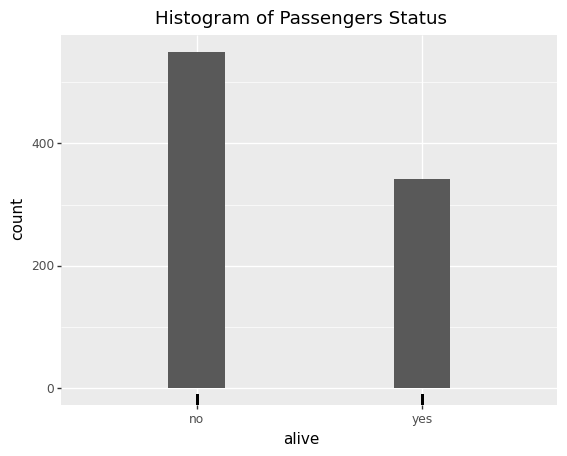

In [ ]:
# Histogram

hist = ggplot(data=df, mapping=aes(x='alive'))

(hist+
 plotnine.labs(title='Histogram of Passengers Status')+
 plotnine.geom_histogram()+
 plotnine.geom_rug()).draw();

/usr/local/lib/python3.7/dist-packages/plotnine/layer.py:360: PlotnineWarning: stat_density : Removed 177 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)


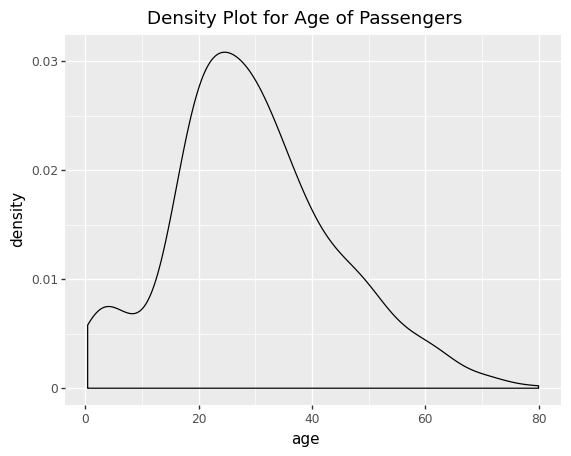

In [ ]:
# Density Plot

kde = ggplot(data=df, mapping=aes(x='age'))

(kde+
 plotnine.geom_density()+
 plotnine.labs(title='Density Plot for Age of Passengers')
 ).draw();

/usr/local/lib/python3.7/dist-packages/plotnine/utils.py:1246: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if pdtypes.is_categorical(arr):
/usr/local/lib/python3.7/dist-packages/plotnine/stats/stat_boxplot.py:86: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if pdtypes.is_categorical(data['x']):


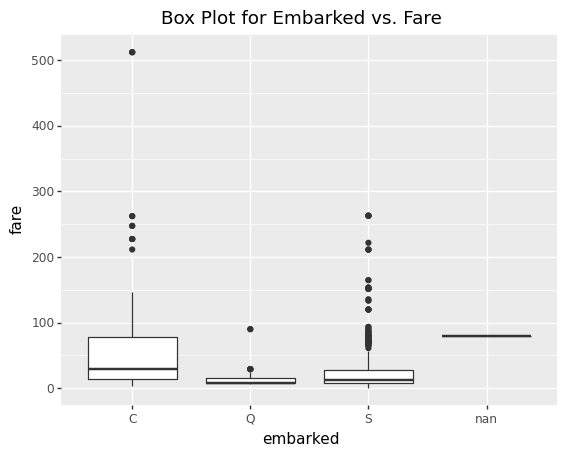

In [ ]:
# Box Plot

bp = ggplot(data = df, mapping=aes(x='embarked', y='fare'))

(bp+
 plotnine.geom_boxplot()+
 plotnine.labs(title='Box Plot for Embarked vs. Fare')).draw();

**Violin Plot**

Violin plots are similar to box plots, except that they also show the probability density of the data at different values, usually smoothed by a kernel density estimator. 

/usr/local/lib/python3.7/dist-packages/plotnine/utils.py:1246: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if pdtypes.is_categorical(arr):
/usr/local/lib/python3.7/dist-packages/plotnine/layer.py:360: PlotnineWarning: stat_ydensity : Removed 177 rows containing non-finite values.
  data = self.stat.compute_layer(data, params, layout)
/usr/local/lib/python3.7/dist-packages/plotnine/layer.py:452: PlotnineWarning: geom_jitter : Removed 177 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


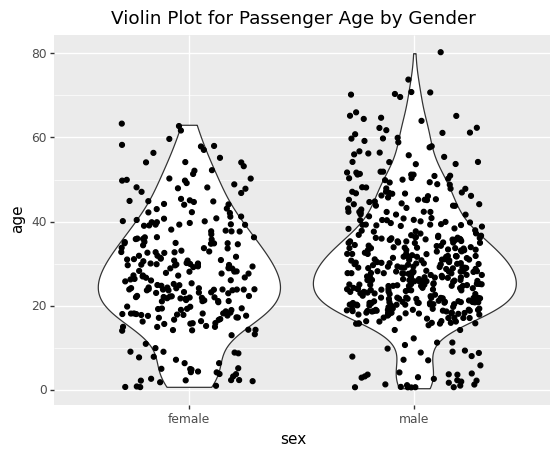

In [ ]:
# Violin Plot

vp = ggplot(data=df, mapping=aes(x='sex', y ='age'))

(vp+
 plotnine.geom_violin()+
 plotnine.labs(title='Violin Plot for Passenger Age by Gender')+
 plotnine.geom_jitter(position=plotnine.position_jitter(0.3))).draw();

**Bubble chart**


This example is based on the famous gapminder dataset. It provides the average life expectancy, gdp per capita and population size for more than 100 countries. 



In [ ]:
import plotly.express as px
df = px.data.gapminder().query("year==2002")
df.head(2)

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
10,Afghanistan,Asia,2002,42.129,25268405,726.734055,AFG,4
22,Albania,Europe,2002,75.651,3508512,4604.211737,ALB,8


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: UserWarning:

Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.



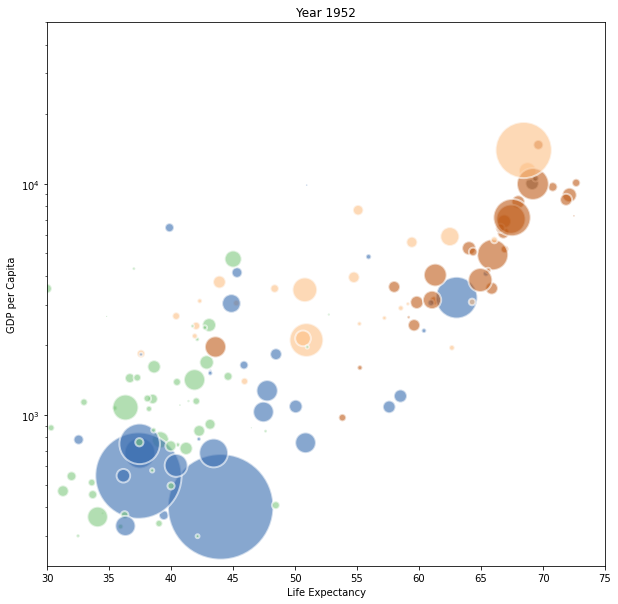

In [ ]:
# import matplotlib
import matplotlib.pyplot as plt

# And I need to transform my categorical column (continent) in a numerical value group1->1, group2->2...
data['continent']=pd.Categorical(data['continent'])

# Set the figure size
plt.figure(figsize=(10, 10))

# Subset of the data for year 1952
data1952 = data[ data.year == 1952 ]

# Scatterplot
plt.scatter(
    x = data1952['lifeExp'], 
    y = data1952['gdpPercap'], 
    s=data1952['pop']/50000, 
    c=data1952['continent'].cat.codes, 
    cmap="Accent", 
    alpha=0.6, 
    edgecolors="white", 
    linewidth=2);
 
# Add titles (main and on axis)
plt.yscale('log')
plt.xlabel("Life Expectancy")
plt.ylabel("GDP per Capita")
plt.title("Year 1952")
plt.ylim(0,50000)
plt.xlim(30, 75);

**Horizontal lollipop plot**

When a lollipop plot shows the relationship between a numerical and a categorical variable, it might be better to re-order the groups on a decreasing order and display them horizontally.

Note that the stem() function does not allow to plot horizontal lollipop plots, thus you need to use the hlines() function.

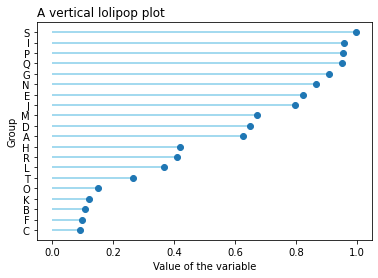

In [ ]:
# libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
 
# Create a dataframe
df = pd.DataFrame({'group':list(map(chr, range(65, 85))), 'values':np.random.uniform(size=20) })
 
# Reorder it based on the values
ordered_df = df.sort_values(by='values')
my_range=range(1,len(df.index)+1)
 
# The horizontal plot is made using the hline function
plt.hlines(y=my_range, xmin=0, xmax=ordered_df['values'], color='skyblue')
plt.plot(ordered_df['values'], my_range, "o")
 
# Add titles and axis names
plt.yticks(my_range, ordered_df['group'])
plt.title("A vertical lolipop plot", loc='left')
plt.xlabel('Value of the variable')
plt.ylabel('Group')

# Show the plot
plt.show()

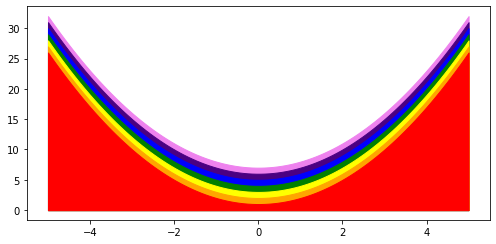

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True
def plot_rainbow_under_curve():
   rainbow_colors = ['violet', 'indigo', 'blue', 'green', 'yellow', 'orange', 'red']
   x = np.linspace(-5, 5, 100)
   for i in range(0, 7):
      plt.plot(x, x ** 2, lw=0)
      plt.fill_between(x, x ** 2 + len(rainbow_colors)-i,color=rainbow_colors[i])

plot_rainbow_under_curve()

plt.show()

### Area Chart with Gradient:

In [ ]:
import altair as alt
from vega_datasets import data

source = data.stocks()
source.head()

,symbol,date,price
0,MSFT,2000-01-01,39.81
1,MSFT,2000-02-01,36.35
2,MSFT,2000-03-01,43.22
3,MSFT,2000-04-01,28.37
4,MSFT,2000-05-01,25.45


In [ ]:
alt.Chart(source).transform_filter(
    'datum.symbol==="GOOG"'
).mark_area(
    line={'color':'darkgreen'},
    color=alt.Gradient(
        gradient='linear',
        stops=[alt.GradientStop(color='white', offset=0),
               alt.GradientStop(color='darkgreen', offset=1)],
        x1=1,
        x2=1,
        y1=1,
        y2=0
    )
).encode(
    alt.X('date:T'),
    alt.Y('price:Q')
)

alt.Chart(...)

**US Income by State: Wrapped Facet**

This example shows how to create a map of income in the US by state, faceted over income brackets

In [ ]:
import altair as alt
from vega_datasets import data

states = alt.topo_feature(data.us_10m.url, 'states')
states

UrlData({
  format: TopoDataFormat({
    feature: 'states',
    type: 'topojson'
  }),
  url: 'https://cdn.jsdelivr.net/npm/vega-datasets@v1.29.0/data/us-10m.json'
})

In [ ]:
source = data.income.url
source

'https://cdn.jsdelivr.net/npm/vega-datasets@v1.29.0/data/income.json'

In [ ]:
alt.Chart(source).mark_geoshape().encode(
    shape='geo:G',
    color='pct:Q',
    tooltip=['name:N', 'pct:Q'],
    facet=alt.Facet('group:N', columns=2),
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(data=states, key='id'),
    as_='geo'
).properties(
    width=300,
    height=175,
).project(
    type='albersUsa'
)

alt.Chart(...)

## Violin Plot:

Violin plots are similar to box plots, except that they also show the probability density of the data at different values, usually smoothed by a kernel density estimator. 

This example shows how to make a Violin Plot using Altair’s density transform:

In [ ]:
import altair as alt
from vega_datasets import data

alt.Chart(data.cars()).transform_density(
    'Miles_per_Gallon',
    as_=['Miles_per_Gallon', 'density'],
    extent=[5, 50],
    groupby=['Origin']
).mark_area(orient='horizontal').encode(
    y='Miles_per_Gallon:Q',
    color='Origin:N',
    x=alt.X(
        'density:Q',
        stack='center',
        impute=None,
        title=None,
        axis=alt.Axis(labels=False, values=[0],grid=False, ticks=True),
    ),
    column=alt.Column(
        'Origin:N',
        header=alt.Header(
            titleOrient='bottom',
            labelOrient='bottom',
            labelPadding=0,
        ),
    )
).properties(
    width=100
).configure_facet(
    spacing=0
).configure_view(
    stroke=None
)

alt.Chart(...)

**Facetted Scatterplot with marginal histograms**

This example demonstrates how to generate a facetted scatterplot, with marginal facetted histograms, and how to share their respective - x,some y-limits.

In [ ]:
import altair as alt
from vega_datasets import data

source = data.iris()
source.head()

,sepalLength,sepalWidth,petalLength,petalWidth,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [ ]:
base = alt.Chart(source)

xscale = alt.Scale(domain=(4.0, 8.0))
yscale = alt.Scale(domain=(1.9, 4.55))

bar_args = {'opacity': .3, 'binSpacing': 0}

points = base.mark_circle().encode(
    alt.X('sepalLength', scale=xscale),
    alt.Y('sepalWidth', scale=yscale),
    color='species',
)

In [ ]:
top_hist = base.mark_bar(**bar_args).encode(
    alt.X('sepalLength:Q',
          # when using bins, the axis scale is set through
          # the bin extent, so we do not specify the scale here
          # (which would be ignored anyway)
          bin=alt.Bin(maxbins=20, extent=xscale.domain),
          stack=None,
          title=''
         ),
    alt.Y('count()', stack=None, title=''),
    alt.Color('species:N'),
).properties(height=60)

In [ ]:
right_hist = base.mark_bar(**bar_args).encode(
    alt.Y('sepalWidth:Q',
          bin=alt.Bin(maxbins=20, extent=yscale.domain),
          stack=None,
          title='',
         ),
    alt.X('count()', stack=None, title=''),
    alt.Color('species:N'),
).properties(width=60)

top_hist & (points | right_hist)

alt.VConcatChart(...)

### Selection Histogram:

This chart shows an example of using an interval selection to filter the contents of an attached histogram, allowing the user to see the proportion of items in each category within the selection.

In [ ]:
import altair as alt
from vega_datasets import data

source = data.cars()
source.head()

,Name,Miles_per_Gallon,Cylinders,Displacement,Horsepower,Weight_in_lbs,Acceleration,Year,Origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,1970-01-01,USA
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,1970-01-01,USA
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,1970-01-01,USA
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,1970-01-01,USA
4,ford torino,17.0,8,302.0,140.0,3449,10.5,1970-01-01,USA


In [ ]:
brush = alt.selection(type='interval')

points = alt.Chart(source).mark_point().encode(
    x='Horsepower:Q',
    y='Miles_per_Gallon:Q',
    color=alt.condition(brush, 'Origin:N', alt.value('lightgray'))
).add_selection(
    brush
)

# The filter transform removes objects from a data stream based on a provided filter expression, selection, or other filter predicate.

bars = alt.Chart(source).mark_bar().encode(
    y='Origin:N',
    color='Origin:N',
    x='count(Origin):Q'
).transform_filter(
    brush
)

points & bars

alt.VConcatChart(...)

Closing Remarks:

Wrap Up